<center>
<hr>
<h1>Summer School in Computational Social Sciences</h1>
<h3>SocialComQuant Project</h3> 
<h3>Michele Tizzoni</h3>
<h2>Visualizing Spatial Data with Geopandas</h2>
<hr>
</center>

The notebook is largely based on a previous version written by [Rossano Schifanella (University of Turin)](https://github.com/rschifan/SpatialAM-21).

## Mapping in Python with geopandas

In [3]:
%matplotlib inline

import matplotlib
import matplotlib.pyplot as plt

from IPython.display import set_matplotlib_formats
set_matplotlib_formats('retina')

import geopandas as gpd
#import pysal as ps

import palettable as pltt
import seaborn as sns
from seaborn import palplot
import numpy as np

## Loading up spatial data 

The easiest way to get from a file to a quick visualization of the data is by loading it as a `GeoDataFrame` and calling the `plot` command. The main library employed for all of this is `geopandas` which is a geospatial extension of the `pandas` library, already introduced before. `geopandas` supports exactly the same functionality that `pandas` does (in fact since it is built on top of it, so most of the underlying machinery is pure `pandas`), plus a wide range of spatial counterparts that make manipulation and general "munging" of spatial data as easy as non-spatial tables.

In two lines of code, we will obtain a graphical representation of the spatial data contained in a file that can be in many formats; actually, since it uses the same drivers under the hood, you can load pretty much the same kind of vector files that QGIS permits. Let us start by plotting single layers in a crude but quick form, and we will build style and sophistication into our plots later on.

* Polygons

Let us begin with the most common type of spatial data in the social science: polygons. For example, we can load the geography of MSOAs in London with the following lines of code:

In [1]:
shape_path='./data/shp/USA_shape.shp'

In [4]:
usa = gpd.read_file(shape_path)

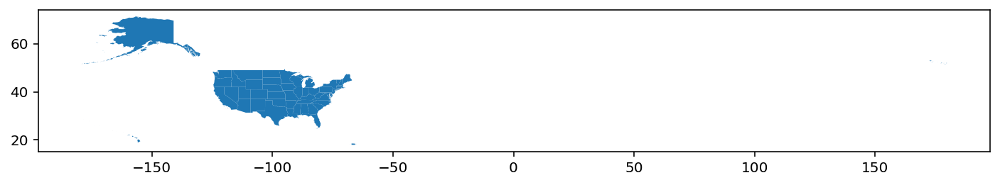

In [5]:
usa.plot(figsize=(12,7))

In [6]:
usa.head()

,AREA,PERIMETER,ST99_D00_,ST99_D00_I,STATE,NAME,LSAD,REGION,DIVISION,LSAD_TRANS,geometry
0,271.25438,227.17142,2,1,02,Alaska,01,4,9,None,"POLYGON ((-147.78711 70.24536, -147.76510 70.2..."
1,0.00375,0.34984,3,2,02,Alaska,01,4,9,None,"POLYGON ((-166.05315 66.26494, -166.03187 66.2..."
2,0.00150,0.15353,4,3,02,Alaska,01,4,9,None,"POLYGON ((-168.89322 65.74470, -168.89875 65.7..."
3,0.03130,0.71223,5,4,02,Alaska,01,4,9,None,"POLYGON ((-168.21012 64.99896, -168.20791 65.0..."
4,0.88934,7.36032,6,5,02,Alaska,01,4,9,None,"POLYGON ((-171.73986 63.71712, -171.73321 63.7..."


In [7]:
usa_cont = usa[(usa.NAME != 'Alaska') & (usa.NAME !='Hawaii') & (usa.NAME != 'Puerto Rico')]

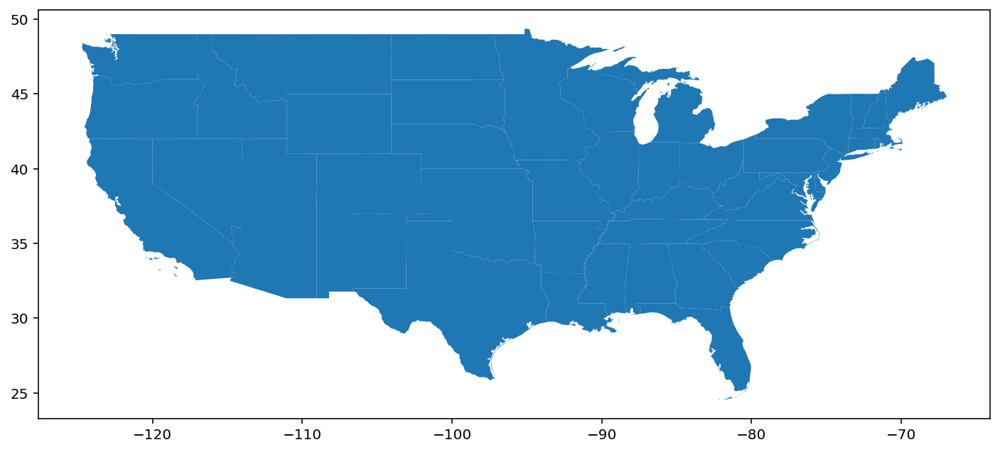

In [8]:
usa_cont.plot(figsize=(12,7))

In [13]:
usa_cont

,AREA,PERIMETER,ST99_D00_,ST99_D00_I,STATE,NAME,LSAD,REGION,DIVISION,LSAD_TRANS,geometry
81,25.53950,31.40718,83,82,27,Minnesota,01,2,4,None,"POLYGON ((-95.15332 49.19311, -95.15342 49.249..."
82,20.85358,30.71739,84,83,53,Washington,01,4,9,None,"POLYGON ((-122.29069 49.00243, -122.28565 49.0..."
83,0.00152,0.17436,85,84,53,Washington,01,4,9,None,"POLYGON ((-123.09055 49.00198, -123.06793 49.0..."
84,45.07846,34.97623,86,85,30,Montana,01,4,8,None,"POLYGON ((-116.04919 49.00091, -116.00103 49.0..."
85,24.45683,29.19034,87,86,16,Idaho,01,4,8,None,"POLYGON ((-116.04919 49.00091, -116.04918 48.8..."
...,...,...,...,...,...,...,...,...,...,...,...
236,0.00307,0.51943,238,237,12,Florida,01,3,5,None,"POLYGON ((-80.92005 24.77882, -80.91043 24.782..."
237,0.00168,0.19176,239,238,12,Florida,01,3,5,None,"POLYGON ((-81.35631 24.75527, -81.35742 24.756..."
238,0.03037,1.37724,240,239,12,Florida,01,3,5,None,"POLYGON ((-81.39612 24.74522, -81.39295 24.743..."
239,0.00030,0.09415,241,240,12,Florida,01,3,5,None,"POLYGON ((-81.24980 24.67336, -81.24609 24.675..."


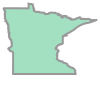

In [12]:
usa_cont.loc[81, 'geometry']

In [14]:
usa_cont.crs

{'init': 'epsg:4326'}

In [15]:
usa_cont_alb = usa_cont.to_crs({'init': 'esri:102003'})

In [16]:
usa_cont_alb.head()

,AREA,PERIMETER,ST99_D00_,ST99_D00_I,STATE,NAME,LSAD,REGION,DIVISION,LSAD_TRANS,geometry
81,25.53950,31.40718,83,82,27,Minnesota,01,2,4,None,"POLYGON ((62537.915 1302915.952, 62474.888 130..."
82,20.85358,30.71739,84,83,53,Washington,01,4,9,None,"POLYGON ((-1922972.602 1549404.889, -1922613.0..."
83,0.00152,0.17436,85,84,53,Washington,01,4,9,None,"POLYGON ((-1979920.980 1565781.660, -1978310.5..."
84,45.07846,34.97623,86,85,30,Montana,01,4,8,None,"POLYGON ((-1474367.320 1437639.369, -1470869.8..."
85,24.45683,29.19034,87,86,16,Idaho,01,4,8,None,"POLYGON ((-1474367.320 1437639.369, -1478695.3..."


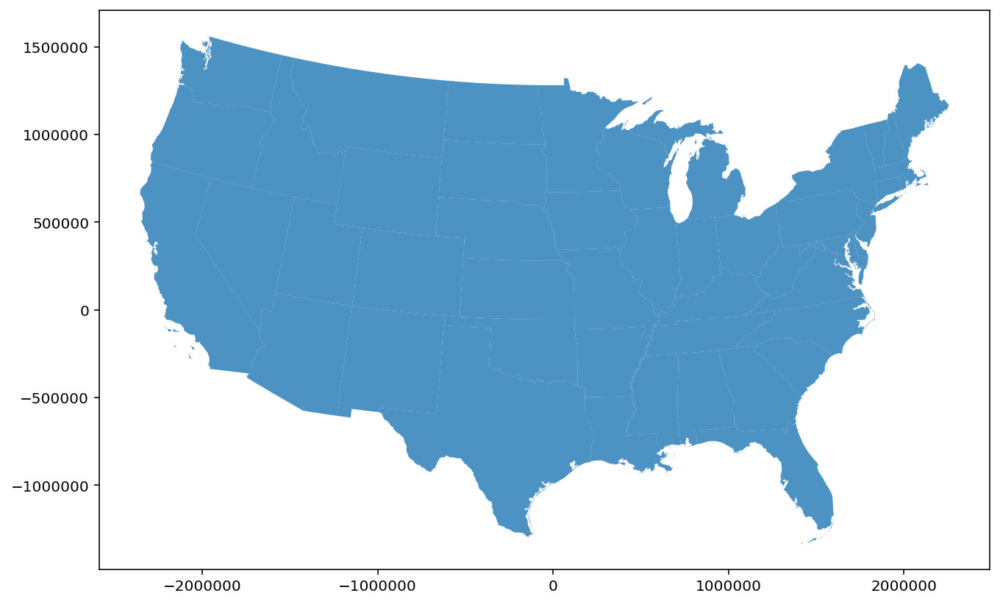

In [17]:
ax=usa_cont_alb.plot(figsize=(12,7), alpha=0.8)

# London

In [18]:
msoas_london_link = 'data/shp/MSOA_London.shp'
msoas_london = gpd.read_file(msoas_london_link)
msoas_london.head()

,MSOA11CD,MSOA11NM,LAD11CD,LAD11NM,RGN11CD,RGN11NM,USUALRES,HHOLDRES,COMESTRES,POPDEN,HHOLDS,AVHHOLDSZ,imd,white_p,p_couple_h,p_couple_1,p_other_mu,crime,geometry
0,E02000001,City of London 001,E09000001,City of London,E12000007,London,7375,7187,188,25.5,4385,1.6,14.303333,77.320636,7.198933,23.398733,9.421321,-1.177000,"MULTIPOLYGON (((531667.624 180534.992, 531647...."
1,E02000002,Barking and Dagenham 001,E09000002,Barking and Dagenham,E12000007,London,6775,6724,51,31.3,2713,2.5,38.270000,64.784314,18.079709,20.531113,9.342227,0.892250,"POLYGON ((548881.563 190845.265, 548881.125 19..."
2,E02000003,Barking and Dagenham 002,E09000002,Barking and Dagenham,E12000007,London,10045,10033,12,46.9,3834,2.6,25.434833,54.636721,20.424448,25.340455,12.367916,0.957167,"POLYGON ((549102.438 189324.625, 548954.500 18..."
3,E02000004,Barking and Dagenham 003,E09000002,Barking and Dagenham,E12000007,London,6182,5937,245,24.8,2318,2.6,24.910500,80.893566,21.873961,30.351330,7.530094,0.195000,"POLYGON ((551549.998 187364.637, 551478.000 18..."
4,E02000005,Barking and Dagenham 004,E09000002,Barking and Dagenham,E12000007,London,8562,8562,0,72.1,3183,2.7,32.942800,66.787179,21.752516,22.941233,11.185676,0.990200,"POLYGON ((549099.634 187656.076, 549161.375 18..."


In [19]:
msoas_london.crs

{'init': 'epsg:27700'}

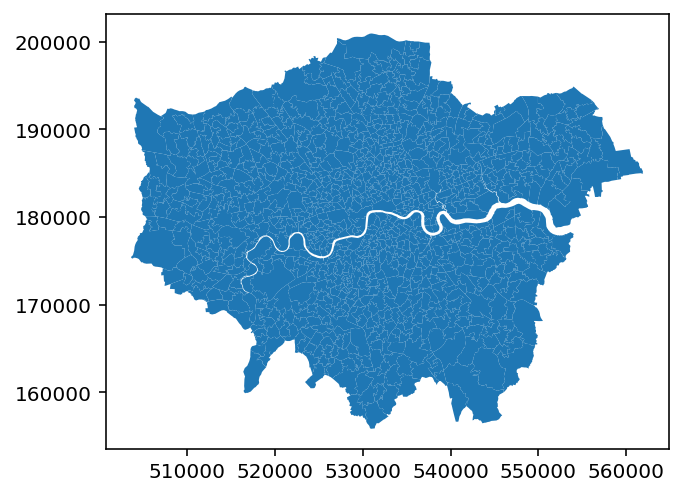

In [20]:
msoas_london.plot()

This might not be the most aesthetically pleasant visual representation of the MSOAs geography, but it is hard to argue it is not quick to produce. We will work on styling and customizing spatial plots later on.

If you call a single row of the `geometry` column, it'll return a small plot ith the shape:

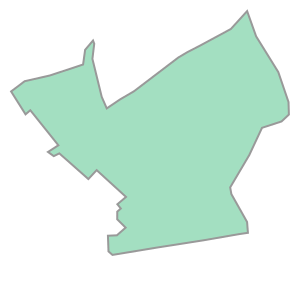

In [21]:
msoas_london.loc[10, 'geometry']

* Lines

Displaying lines is as straight-forward as polygons. To load tube lines in London:

In [22]:
london_tube_link = 'data/shp/tublines.shp'
london_tube = gpd.read_file(london_tube_link)

In [23]:
london_tube.crs

{'init': 'epsg:27700'}

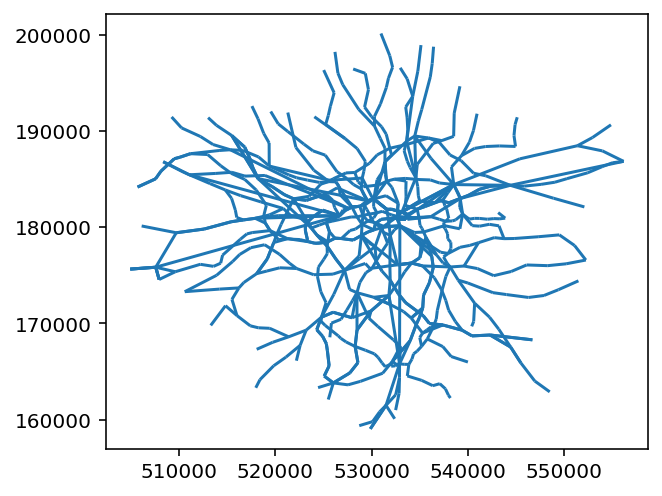

In [24]:
london_tube.plot()

* Points

Finally, points follow a similar structure. If we want to represent named places in London:

In [25]:
london_pois_link = 'data/shp/osm_pois_london.shp'
london_pois = gpd.read_file(london_pois_link)

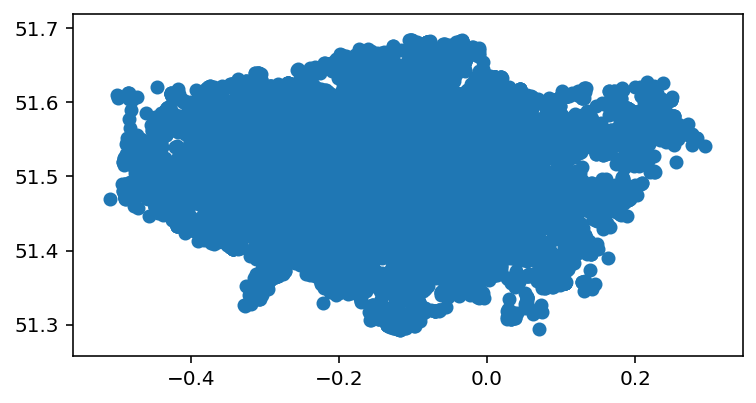

In [26]:
london_pois.plot()

In [82]:
london_pois.crs

{'init': 'epsg:4326'}

In [27]:
london_pois = london_pois.to_crs({'init':'epsg:27700'})

We need to change projection

In [30]:
london_pois.head()

,osm_id,code,fclass,name,geometry
0,1,2724,memorial,Prime Meridian of the World,POINT (538883.663 177336.800)
1,108042,2304,pub,The Jeremy Bentham,POINT (529446.650 182160.772)
2,108539,2566,bicycle_rental,Windsor Terrace,POINT (532353.841 182857.641)
3,283885,2204,park,Ecology Park,POINT (540013.605 179263.992)
4,451152,2304,pub,The Dignity,POINT (525136.107 190654.670)


In [28]:
london_pois['fclass'].unique()

array(['memorial', 'pub', 'bicycle_rental', 'park', 'restaurant',
       'post_box', 'attraction', 'library', 'post_office',
       'public_building', 'telephone', 'fountain', 'artwork', 'museum',
       'toilet', 'cafe', 'pitch', 'recycling', 'bar', 'atm', 'cinema',
       'waste_basket', 'college', 'university', 'supermarket',
       'graveyard', 'hotel', 'laundry', 'courthouse', 'school',
       'pharmacy', 'sports_centre', 'monument', 'convenience', 'bank',
       'beverages', 'fast_food', 'fire_station', 'water_tower', 'doctors',
       'department_store', 'theatre', 'playground', 'bench',
       'bicycle_shop', 'newsagent', 'gift_shop', 'arts_centre',
       'recycling_paper', 'veterinary', 'dentist', 'recycling_glass',
       'chemist', 'hospital', 'town_hall', 'tourist_info', 'car_rental',
       'police', 'bakery', 'travel_agent', 'doityourself', 'windmill',
       'comms_tower', 'car_sharing', 'camera_surveillance', 'tower',
       'ruins', 'nursing_home', 'embassy', 'stadium

In [31]:
london_pubs = london_pois.loc[london_pois['fclass']=="pub"]
london_pubs.info()

<class 'geopandas.geodataframe.GeoDataFrame'>
Int64Index: 2029 entries, 1 to 49527
Data columns (total 5 columns):
 #   Column    Non-Null Count  Dtype   
---  ------    --------------  -----   
 0   osm_id    2029 non-null   object  
 1   code      2029 non-null   int64   
 2   fclass    2029 non-null   object  
 3   name      1994 non-null   object  
 4   geometry  2029 non-null   geometry
dtypes: geometry(1), int64(1), object(3)
memory usage: 95.1+ KB


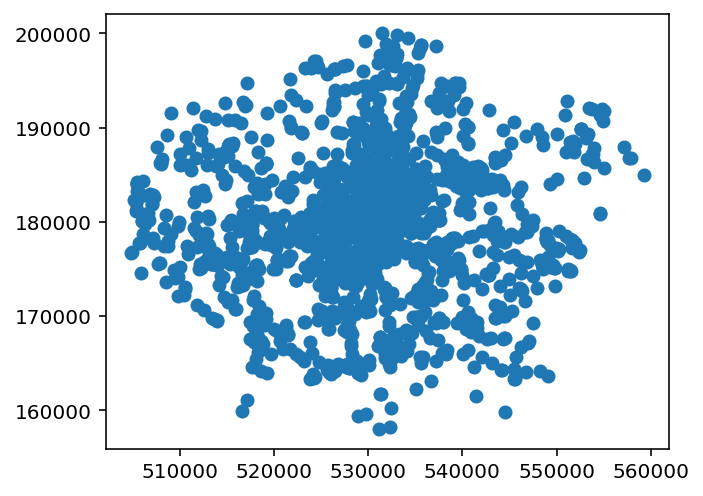

In [32]:
london_pubs.plot()

## Styling plots

It is possible to tweak several aspects of a plot to customize if to particular needs. In this section, we will explore some of the basic elements that will allow us to obtain more compelling maps.

* Remove axis
* Set title
* Customizing colors, lines, alpha
* Customizing size

These are styling options. Omit them or alter them to suit.

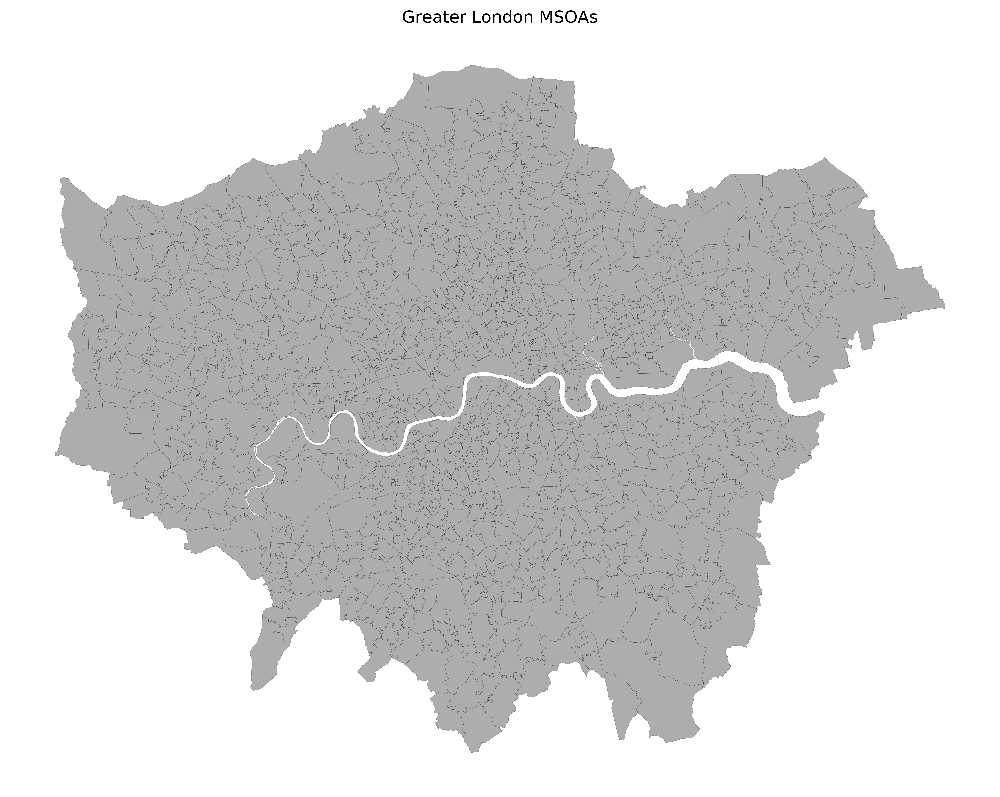

In [33]:
# Setup figure and axis
f, ax = plt.subplots(
    1, 
    figsize=(12., 8.),
    dpi=200,
    subplot_kw=dict(aspect='equal'))

# Remove axis frames
ax.axis('off')

# Plot layer of polygons on the axis
msoas_london.plot(ax=ax, linewidth=0.1, facecolor='#999999', edgecolor='#111111', alpha=0.8)
# Display
plt.title('Greater London MSOAs')
plt.tight_layout()
plt.show()    

## Composing multi-layer maps

So far we have considered many aspects of plotting a single layer of data. However, in many cases, an effective map will require more than one: for example we might want to display streets on top of the polygons of neighborhoods, and add a few points for specific locations we want to highlight. At the very heart of GIS is the possibility to combine spatial information from different sources by overlaying it on top of each other, and this is fully supported in Python.

Essentially, combining different layers on a single map boils down to adding each of them to the same axis in a sequential way, as if we were literally overlaying one on top of the previous one. For example, let us get the simplest possible plot, one with the polygons from the MSOAs and the tube lines on top of them:

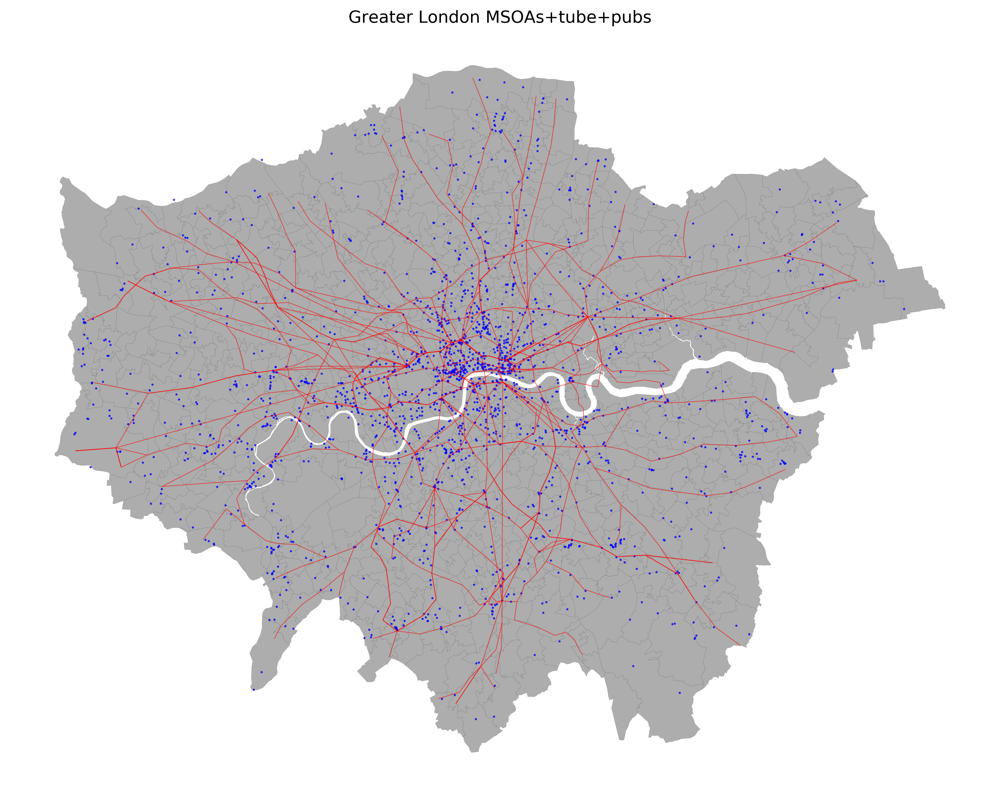

In [34]:
# Setup figure and axis
f, ax = plt.subplots(
    1, 
    figsize=(12., 8.),
    dpi=200,
    subplot_kw=dict(aspect='equal'))

# Remove axis frames
ax.axis('off')

# Plot layer of polygons on the axis
msoas_london.plot(ax=ax, linewidth=0.05, facecolor='#999999', edgecolor='#111111', alpha=0.8)
london_tube.plot(ax=ax, linewidth=0.5, edgecolor='red', alpha=0.6)
london_pubs.plot(ax=ax, linewidth=0.1, facecolor='blue', alpha=0.8, markersize=2)
# Display
plt.title('Greater London MSOAs+tube+pubs')
plt.tight_layout()
plt.show()    

## Using palettes to create aesthetically pleasant maps

The choice of colors can influence the look and, ultimately, the effectiveness of a map. Although in some cases picking colors that simply allow you to distinguish the different elements might suffice, sometimes, you want to convey certain feelings (warmth, safety, etc.). In those cases, using preexisting palettes can be useful.

In this section, we will learn how to use pre-existent palettes to style your maps. We will be using the library [`palettable`](https://jiffyclub.github.io/palettable/), which provides many "canned" palettes. We will also use the handy function `palplot` (from the library `seaborn`) to examine the colors quickly.

For the sake of the example, let us use a palette based on one of Wes Anderson's movies, Darjeeling Limited:

<img src='http://66.media.tumblr.com/2815b755b493555dd4a74fc9f7c84bdb/tumblr_nj7cclt9qb1tvvqeko1_500.jpg'></img>

Here is how you can pull out those colors:

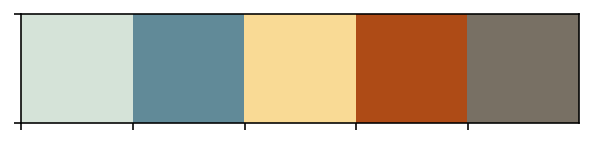

In [35]:
wes = pltt.wesanderson.Darjeeling2_5.hex_colors
palplot(wes)

Now, note how the object `wes` simply contains a list of colors in the hex standard:

In [36]:
wes

['#D5E3D8', '#618A98', '#F9DA95', '#AE4B16', '#787064']

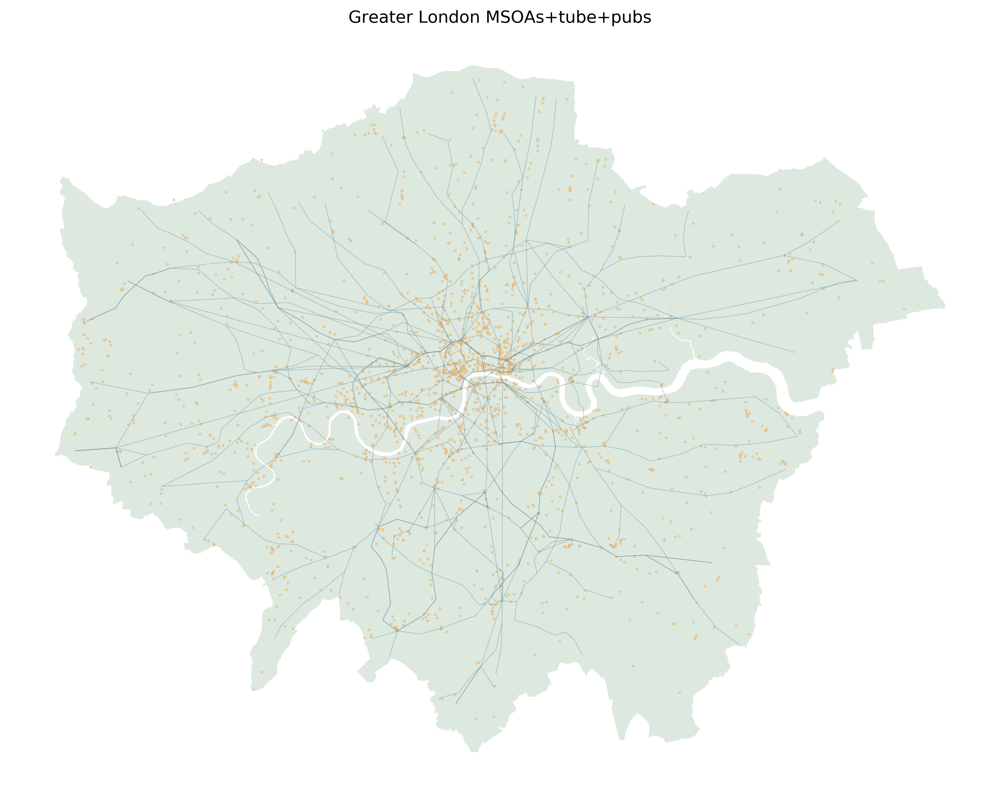

In [37]:
# Setup figure and axis
f, ax = plt.subplots(
    1, 
    figsize=(12., 8.),
    dpi=200,
    subplot_kw=dict(aspect='equal'))

# Remove axis frames
ax.axis('off')
ax.set_title('Greater London MSOAs+tube+pubs')

# Plot layer of polygons on the axis
msoas_london.plot(ax=ax, linewidth=0.05, facecolor='#D5E3D8', edgecolor='#D5E3D8', alpha=0.8)
london_tube.plot(ax=ax, linewidth=0.5, edgecolor='#618A98', alpha=0.4)
london_pubs.plot(ax=ax, linewidth=0.1, facecolor='#F9DA95', alpha=1.0, edgecolor='#AE4B16', markersize=2)
# Display
plt.tight_layout()
plt.show()    

## Saving maps to figures 

Once we have produced a map we are content with, we might want to save it to a file so we can include it into a report, article, website, etc. Exporting maps in Python is as simple as replacing `plt.show` by `plt.savefig` at the end of the code block to specify where and how to save it. For example to save the previous map into a `png` file in the same folder where the notebook is hosted:

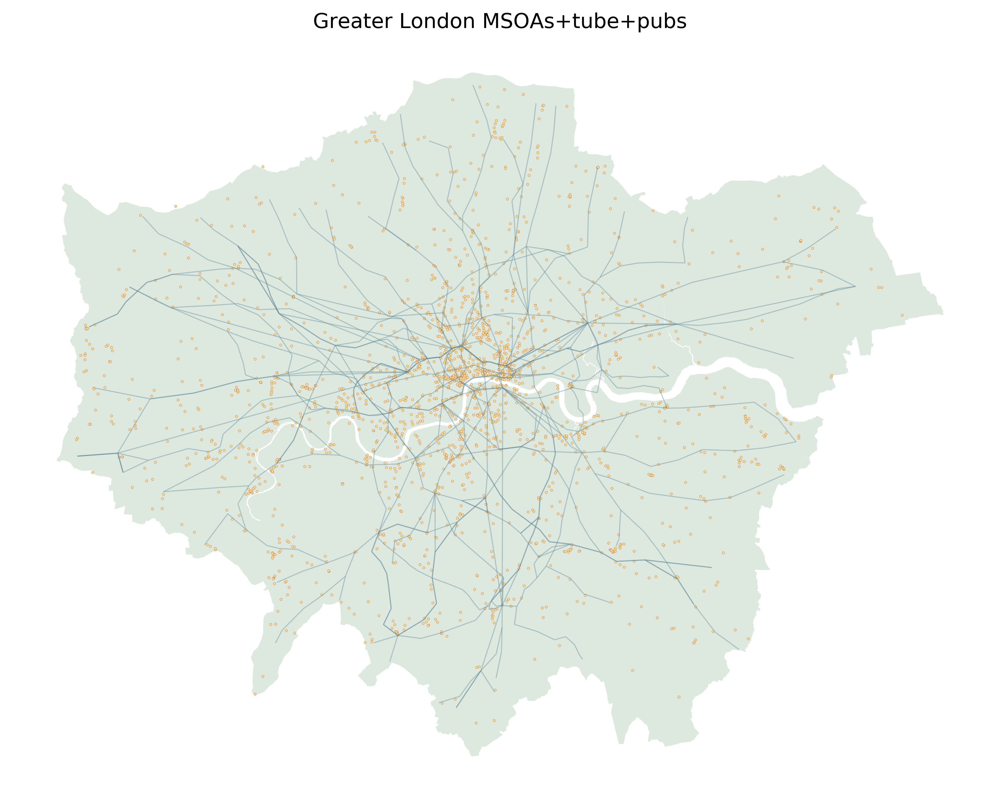

In [38]:
# Setup figure and axis
f, ax = plt.subplots(
    1, 
    figsize=(12., 8.),
    dpi=200,
    subplot_kw=dict(aspect='equal'))

# Remove axis frames
ax.axis('off')
ax.set_title('Greater London MSOAs+tube+pubs')

# Plot layer of polygons on the axis
msoas_london.plot(ax=ax, linewidth=0.05, facecolor='#D5E3D8', edgecolor='#D5E3D8', alpha=0.8)
london_tube.plot(ax=ax, linewidth=0.6, edgecolor='#618A98', alpha=0.4)
london_pubs.plot(ax=ax, linewidth=0.1, facecolor='#F9DA95', alpha=1.0, edgecolor='#AE4B16', markersize=2)
# Save to file
plt.savefig('./london_tube_pubs.png', dpi=300, transparent=True, tight_layout=True)

# Choropleths

## Unique values

A choropleth for categorical variables simply assigns a different color to every potential value in the series. The main requirement in this case is then for the color scheme to reflect the fact that different values are not ordered or follow a particular scale.

In Python, thanks to `geopandas`, creating categorical choropleths is possible with one line of code. To demonstrate this, we can plot the spatial distribution of MSOAs with a more white population than other races and viceversa:

In [39]:
msoas_london['majority_race'] = np.where(msoas_london.eval("white_p > 50"), "White", "Other")

In [64]:
from distutils.version import LooseVersion


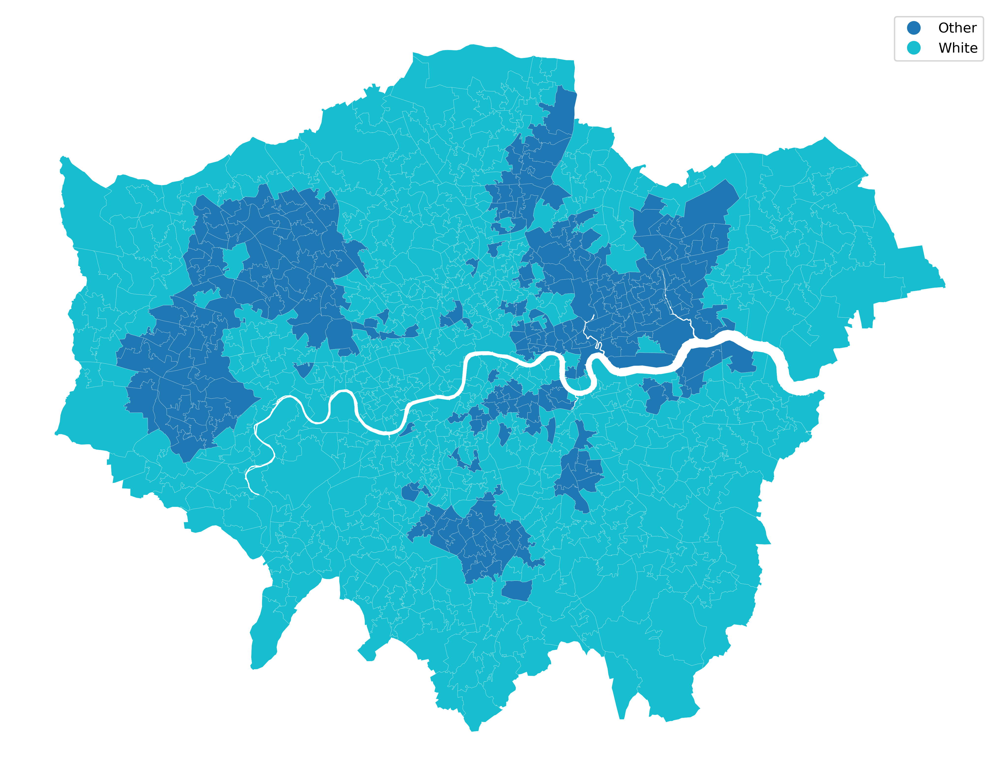

In [41]:
f, ax = plt.subplots(
    1, 
    figsize=(12., 8.),
    dpi=200,
    subplot_kw=dict(aspect='equal'))

ax.axis('off')

msoas_london.plot(
    ax=ax,
    column='majority_race',
    categorical=True,
    alpha=1, 
    edgecolor='w', 
    linewidth=0.1, 
    legend=True,
    antialiased=True
)

plt.tight_layout()
plt.show()

Let us stop for a second in a few crucial aspects:

* Note how we are using the same approach as for basic maps, the command `plot`, but we now need to add the argument `column` to specify which column in particular is to be represented.
* Since the variable is categorical we need to make that explicit by setting the argument `categorical` to `True`.
* As an optional argument, we can set `legend` to `True` and the resulting figure will include a legend with the names of all the values in the map.
* Unless we specify a different colormap, the selected one respects the categorical nature of the data by not implying a gradient or scale but a qualitative structure.

Let's plot a non-categorical variable

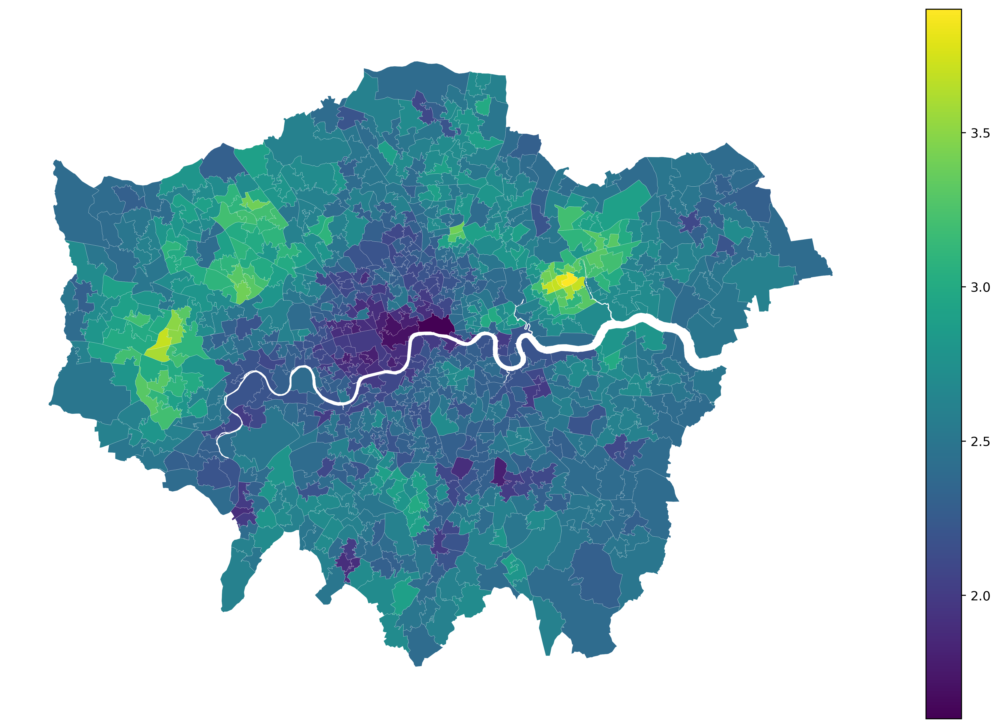

In [43]:
f, ax = plt.subplots(
    1, 
    figsize=(12., 8.),
    dpi=200,
    subplot_kw=dict(aspect='equal'))

ax.axis('off')

msoas_london.plot(
    ax=ax,
    column='AVHHOLDSZ',
    categorical=False,
    alpha=1, 
    edgecolor='w', 
    linewidth=0.1, 
    legend=True, 
    antialiased=True
)

plt.tight_layout()
plt.show()